In [14]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import codedapertures as ca
import scipy as sp
import os
import cv2

from scipy.ndimage.filters import convolve
import pickle

from utils import get_objects_from_config, zoom_in_image
from experiment import CodApSimulator, play_simulation, plot_results
from image_preprocessing import process_image
from decoding_algorythms import (
    get_mura_decoding_pattern,
    fourier_image_reconstruction,
    get_fourier_decoding_pattern,
)
from reconstruction_metrics import get_metrics, minmax_image_renormalization

from matplotlib import rcParams

rcParams["figure.dpi"] = 500
rcParams["savefig.dpi"] = 500
# Set the axis labels fontsize
rcParams["axes.labelsize"] = 18
# Set the titles fontsize
rcParams["axes.titlesize"] = 18

/var/folders/m6/dj2mn85s7jg_r9ptl4kt_6q80000gn/T/ipykernel_46642/788175088.py:9: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve


In [7]:
rcParams

RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': 'line',
          'axes.edgecolor': 'black',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': False,
          'axes.grid.axis': 'both',
          'axes.grid.which':

In [2]:
sensor_types = ['perfect', 'skipper', 'normal_ccd']

In [3]:
def get_optimal_threshold(
        simulator: CodApSimulator,
        min_threshold: float=0.0001,
        max_threshold: float=1,
        n_thresholds: int=20,
        PLOT=False
):
    """Computes the threshold that minimizes the MSE of the decoded image.
    The threshold is computed by evaluating the MSE for a range of thresholds
    between min_threshold and max_threshold, and then selecting the threshold
    that minimizes the MSE.
    
    Args:
    
        simulator (CodApSimulator): The simulator object that contains the
            source and decoder objects.
        min_threshold (float): The minimum threshold to evaluate.
        max_threshold (float): The maximum threshold to evaluate.
        n_thresholds (int): The number of thresholds to evaluate.
        
    Returns:
    
        optimal_threshold (float): The threshold that minimizes the MSE.
        optimal_threshold_mse (float): The MSE of the decoded image with the
            optimal threshold."""
    mse_list = []
    threshold_list = np.linspace(min_threshold, max_threshold, n_thresholds)
    for threshold in threshold_list:

        simulator.decoder.threshold = threshold
        simulator.decode_image()

        metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
        mse_list.append(metrics['mse'])
    if PLOT:
        plt.plot(threshold_list, mse_list)
        plt.show()
    optimal_threshold = threshold_list[np.argmin(mse_list)]
    optimal_threshold_mse = np.min(mse_list)
    return optimal_threshold, optimal_threshold_mse

### Satellite Experiment

In [ ]:
# WORK IN PROGRESS.

def compute_lines_contrast(reconstructed_image: np.ndarray):
    """Computes the separation of the lines of a reconstructed image of horizontal 
    lines.
    
    Args:
    
        reconstructed_image (np.ndarray): The reconstructed image.
        
    Returns:
    
        line_separation (float): The line separation of the reconstructed
            image."""
    # Compute the contrast between the valey and the peaks, with respects to the
    # mean value of the image

    # Get the intensity profile of the image, along the y axis
    intensity_profile = np.mean(reconstructed_image, axis=1)
    # Compute the peaks of the intensity profile
    peaks = sp.signal.find_peaks(intensity_profile)[0]
    # Compute the valleys of the intensity profile
    valleys = sp.signal.find_peaks(-intensity_profile)[0]
    # Compute the contrast between the peaks and the valleys
    contrast = np.abs(intensity_profile[peaks] / intensity_profile[valleys])

    # Compute the mean value of the image
    mean_value = np.mean(reconstructed_image)
    # Compute the maximum value of the image


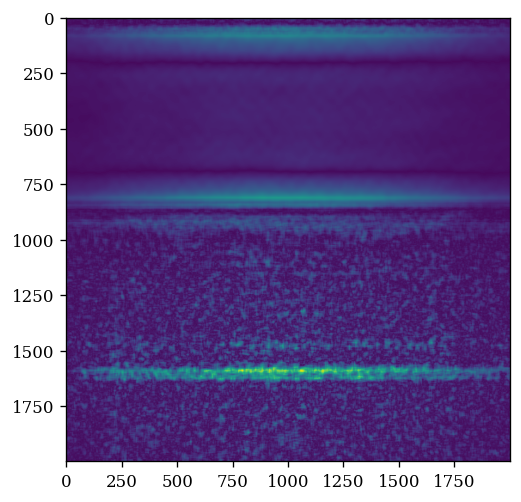

In [49]:
# separation = 40
with open(f'results/sensor_comparison_experiment/full_lines | mura 3 | perfect | 30/simulator.pkl', 'rb') as file:
    simulator = pickle.load(file)

simulator.decoder.threshold = 0.005
simulator.decode_image()
plt.imshow(simulator.decoder.rescaled_decoded_image)

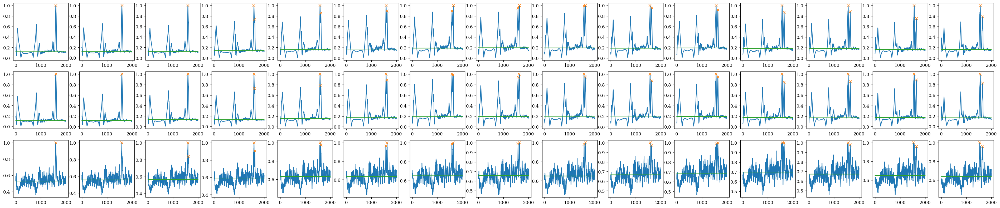

In [201]:
from scipy.signal import find_peaks

peaks_estimated_height_list_per_sensor = {
    'perfect': [0.8, 0.8, 0.82, 0.7, 0.85, 0.85, 0.88, 0.9, 0.9, 0.9, 0.85, 0.8, 0.8, 0.7, 0.7],
    'skipper': [0.8, 0.8, 0.82, 0.67, 0.78, 0.85, 0.92, 0.9, 0.9, 0.85, 0.85, 0.8, 0.8, 0.8, 0.8],
    'normal_ccd': [0.8, 0.8, 0.82, 0.85, 0.85, 0.85, 0.85, 0.9, 0.9, 0.9, 0.95, 0.95, 0.95, 0.95, 0.95]
}
peaks_estimated_separation_list_per_sensor = {
    'perfect': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 40, 30, 30, 30],
    'skipper': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 40, 30, 30, 30],
    'normal_ccd': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 40, 30, 30, 30]
}
lines_separation_list = np.arange(15, 90, 5)
relative_valley_steepness_list_per_sensor = {sensor_type: [] for sensor_type in sensor_types}
absolute_valley_steepness_list_per_sensor = {sensor_type: [] for sensor_type in sensor_types}

fig, axs = plt.subplots(3, 15, figsize=(40, 8))

for j, sensor_type in enumerate(sensor_types):
    for i, separation in enumerate(lines_separation_list):
        peaks_estimated_height_list = peaks_estimated_height_list_per_sensor[sensor_type]
        peaks_estimated_separation_list = peaks_estimated_separation_list_per_sensor[sensor_type]

        with open(f'results/sensor_comparison_experiment/full_lines | mura 3 | {sensor_type} | {separation}/simulator.pkl', 'rb') as file:
            simulator = pickle.load(file)

        normalized_intensity_profile = (
            simulator.decoder.rescaled_decoded_image.mean(axis=1)
            / simulator.decoder.rescaled_decoded_image.mean(axis=1).max()
        )

        # Find the two peaks in the intensity profile
        peaks = find_peaks(normalized_intensity_profile, height=peaks_estimated_height_list[i], prominence=0.05, distance=peaks_estimated_separation_list[i])[0]
        peak_heights = normalized_intensity_profile[peaks]
        
        # Plot: mark the two peaks in the intensity profile
        axs[j, i].plot(normalized_intensity_profile, label="intensity profile")
        axs[j, i].plot(peaks, normalized_intensity_profile[peaks], "x")
        axs[j, i].plot(
            np.ones(len(normalized_intensity_profile))
            * np.median(normalized_intensity_profile),
            label="baseline",
        )
        # axs[j, i].plot(simulator.source.screen.sum(axis=1)/simulator.source.screen.sum(axis=1).max())
        # axs[j, i].legend()

        # Compute the distance between the two peaks
        if len(peaks) < 2:
            relative_valley_steepness_list_per_sensor[sensor_type].append(0)
            absolute_valley_steepness_list_per_sensor[sensor_type].append(0)
            continue
        separation = peaks[1] - peaks[0]
        # Compute the relative height of the valley between the peaks, with respect to the
        # baseline value of the intensity profile
        valley_height = normalized_intensity_profile[peaks[0] : peaks[1]].min()
        relative_valley_height = (valley_height - np.median(normalized_intensity_profile)) / (
            peak_heights.mean() - np.median(normalized_intensity_profile)
        )
        relative_valley_steepness = (1 - relative_valley_height)
        # Compute the absolute height of the valley between the peaks
        absolute_valley_steepness = np.mean(peak_heights) - valley_height

        relative_valley_steepness_list_per_sensor[sensor_type].append(relative_valley_steepness)
        absolute_valley_steepness_list_per_sensor[sensor_type].append(absolute_valley_steepness)

0 15
1 45
2 75


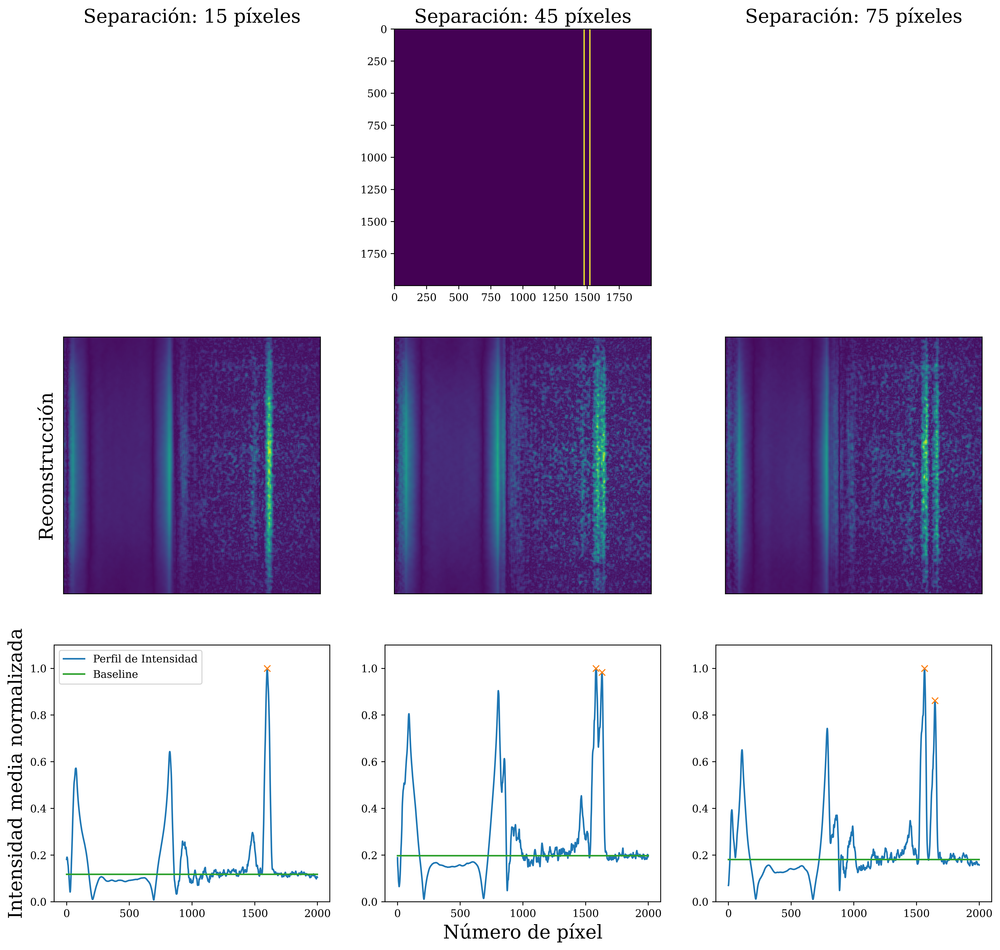

In [16]:
from scipy.signal import find_peaks

peaks_estimated_height_list_per_sensor = {
    'perfect': [0.8, 0.8, 0.82, 0.7, 0.85, 0.85, 0.88, 0.9, 0.9, 0.9, 0.85, 0.8, 0.8, 0.7, 0.7],
    'skipper': [0.8, 0.8, 0.82, 0.67, 0.78, 0.85, 0.92, 0.9, 0.9, 0.85, 0.85, 0.8, 0.8, 0.8, 0.8],
    'normal_ccd': [0.8, 0.8, 0.82, 0.85, 0.85, 0.85, 0.85, 0.9, 0.9, 0.9, 0.95, 0.95, 0.95, 0.95, 0.95]
}
peaks_estimated_separation_list_per_sensor = {
    'perfect': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 40, 30, 30, 30],
    'skipper': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 40, 30, 30, 30],
    'normal_ccd': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 40, 30, 30, 30]
}
lines_separation_list = np.arange(15, 90, 5)
relative_valley_steepness_list_per_sensor = {sensor_type: [] for sensor_type in sensor_types}
absolute_valley_steepness_list_per_sensor = {sensor_type: [] for sensor_type in sensor_types}

fig, axs = plt.subplots(3, 3, figsize=(16, 15))

sensor_type = 'skipper'

iteration = 0
for i, separation in enumerate(lines_separation_list):
    if separation not in [15, 45, 75]:
        continue
    print(iteration, separation)
    peaks_estimated_height_list = peaks_estimated_height_list_per_sensor[sensor_type]
    peaks_estimated_separation_list = peaks_estimated_separation_list_per_sensor[sensor_type]

    with open(f'results/sensor_comparison_experiment/full_lines | mura 3 | {sensor_type} | {separation}/simulator.pkl', 'rb') as file:
        simulator = pickle.load(file)

    normalized_intensity_profile = (
        simulator.decoder.rescaled_decoded_image.mean(axis=1)
        / simulator.decoder.rescaled_decoded_image.mean(axis=1).max()
    )

    # Find the two peaks in the intensity profile
    peaks = find_peaks(normalized_intensity_profile, height=peaks_estimated_height_list[i], prominence=0.05, distance=peaks_estimated_separation_list[i])[0]
    peak_heights = normalized_intensity_profile[peaks]
    
    axs[0, iteration].set_title(f'Separación: {separation} píxeles')
    # Plot the reconstructed image
    axs[1, iteration].imshow(simulator.decoder.rescaled_decoded_image.T, cmap='viridis')
    axs[1, iteration].set_xticks([])
    axs[1, iteration].set_yticks([])
    axs[1, 0].set_ylabel('Reconstrucción')
    
    # Plot: mark the two peaks in the intensity profile
    if iteration == 1:
        axs[2, iteration].set_xlabel('Número de píxel')
    axs[2, 0].set_ylabel('Intensidad media normalizada')
    axs[2, iteration].plot(normalized_intensity_profile, label="Perfil de Intensidad")
    axs[2, iteration].plot(peaks, normalized_intensity_profile[peaks], "x")
    axs[2, iteration].plot(
        np.ones(len(normalized_intensity_profile))
        * np.median(normalized_intensity_profile),
        label="Baseline",
    )
    axs[2, 0].legend()
    axs[2, iteration].set_ylim([0, 1.1])
    # axs[j, i].plot(simulator.source.screen.sum(axis=1)/simulator.source.screen.sum(axis=1).max())
    # axs[j, i].legend()

    if iteration == 1:
        axs[0, iteration].imshow(simulator.source.screen.T, cmap='viridis')
    else:
        # Hide the axis
        axs[0, iteration].set_axis_off()

    # Compute the distance between the two peaks
    if len(peaks) < 2:
        relative_valley_steepness_list_per_sensor[sensor_type].append(0)
        absolute_valley_steepness_list_per_sensor[sensor_type].append(0)
        iteration += 1
        continue
    separation = peaks[1] - peaks[0]
    # Compute the relative height of the valley between the peaks, with respect to the
    # baseline value of the intensity profile
    valley_height = normalized_intensity_profile[peaks[0] : peaks[1]].min()
    relative_valley_height = (valley_height - np.median(normalized_intensity_profile)) / (
        peak_heights.mean() - np.median(normalized_intensity_profile)
    )
    relative_valley_steepness = (1 - relative_valley_height)
    # Compute the absolute height of the valley between the peaks
    absolute_valley_steepness = np.mean(peak_heights) - valley_height

    relative_valley_steepness_list_per_sensor[sensor_type].append(relative_valley_steepness)
    absolute_valley_steepness_list_per_sensor[sensor_type].append(absolute_valley_steepness)

    iteration += 1

plt.savefig('line_separation.pdf', bbox_inches='tight')

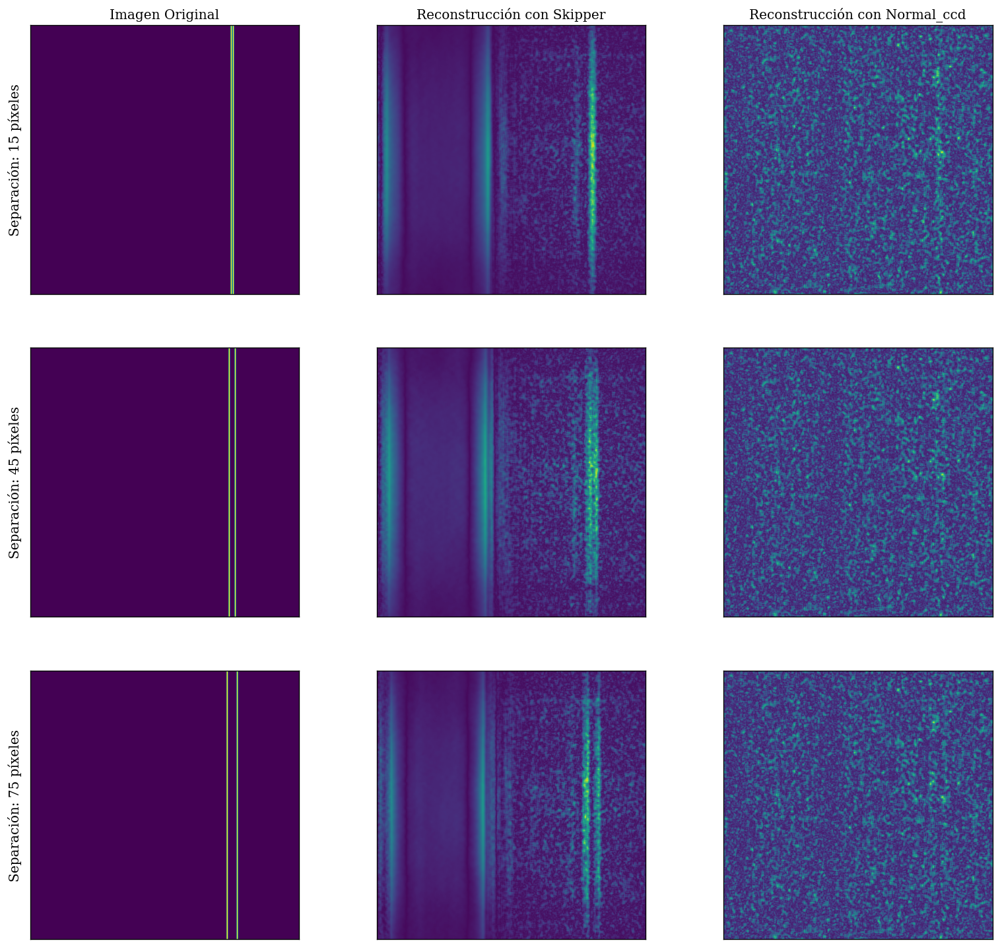

In [121]:
from scipy.signal import find_peaks

fig, axs = plt.subplots(3, 3, figsize=(16, 15))

for i, separation in enumerate(lines_separation_list):
    for j, sensor_type in enumerate(sensor_types):

        with open(f'results/sensor_comparison_experiment/full_lines | mura 3 | {sensor_type} | {separation}/simulator.pkl', 'rb') as file:
            simulator = pickle.load(file)
        
        if j == 0:
            # Plot the source image
            axs[i, 0].imshow(simulator.source.screen.T, cmap='viridis')
            axs[i, 0].set_xticks([])
            axs[i, 0].set_yticks([])
            axs[0, 0].set_title('Imagen Original')
            axs[i, 0].set_ylabel(f'Separación: {separation} píxeles')
        else:
            # Plot the reconstructed image
            axs[i, j].imshow(simulator.decoder.rescaled_decoded_image.T, cmap='viridis')
            axs[i, j].set_xticks([])
            axs[i, j].set_yticks([])
            axs[0, j].set_title(f'Reconstrucción con {sensor_type.capitalize()}')

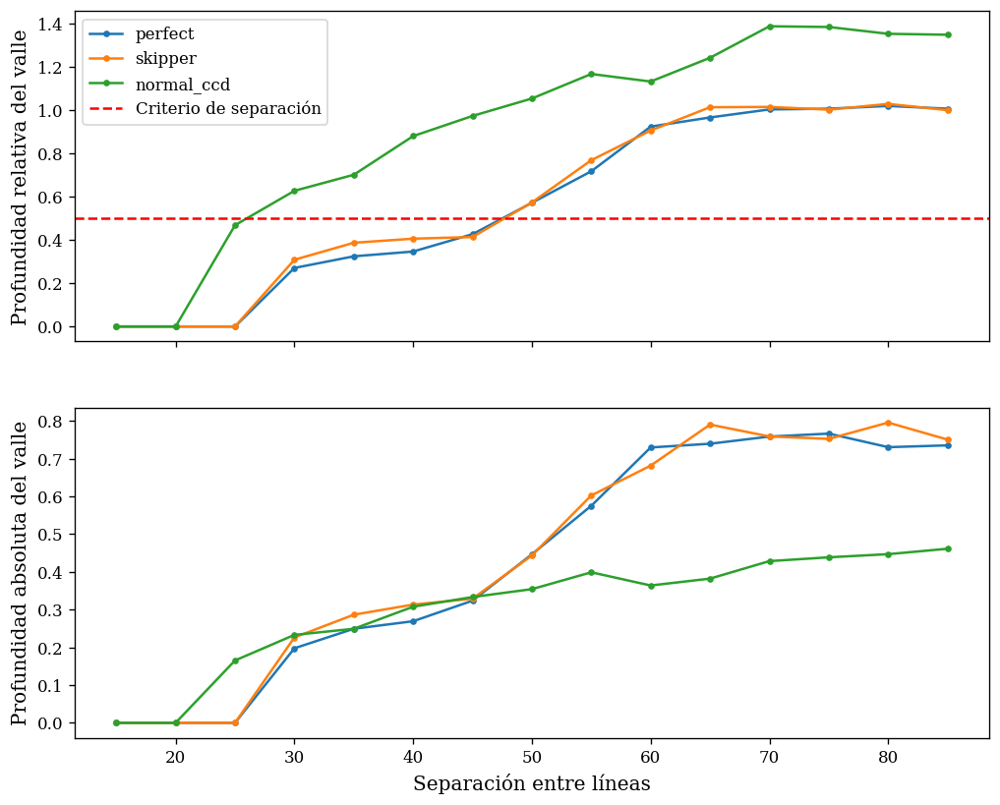

In [217]:
fig, axs = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

for sensor_type in sensor_types:
    axs[0].plot(lines_separation_list, relative_valley_steepness_list_per_sensor[sensor_type], '.-', label=sensor_type)
    axs[1].plot(lines_separation_list, absolute_valley_steepness_list_per_sensor[sensor_type], '.-', label=sensor_type)

axs[0].axhline(0.5, ls='--', color='red', label='Criterio de separación')
axs[0].set_ylabel('Profundidad relativa del valle')
axs[1].set_xlabel('Separación entre líneas')
axs[1].set_ylabel('Profundidad absoluta del valle')
axs[0].legend()
plt.show()


In [ ]:
separations_list = np.arange(20, 200, 20).astype(int)


for separation in separations_list:
    with open(f'results/sensor_comparison_experiment/lines | mura 3 | normal_ccd | {separation}/simulator.pkl', 'rb') as file:
        simulator = pickle.load(file)
    optimal_threshold, _ = get_optimal_threshold(simulator, 0.0001, 0.1, 15)
    simulator.decoder.threshold = optimal_threshold
    simulator.decode_image()
    # Compute the contrast between the peaks and the valey of the reconstructed image
    


### Lamdba reconstruction comparison experiment

In [11]:
mse_list_per_sensor = {sensor_type: [] for sensor_type in sensor_types}
photons_per_pixel_list = np.geomspace(100, 500000, 10)
for sensor_type in sensor_types:
        for photons_per_pixel in photons_per_pixel_list:

                with open(f'results/sensor_comparison_lambda_experiment/lambda | mura 5 | {sensor_type} | {photons_per_pixel}/simulator.pkl', 'rb') as file:
                        simulator = pickle.load(file)

                optimal_threshold, mse = get_optimal_threshold(simulator)
                mse_list_per_sensor[sensor_type].append(mse)
                simulator.decoder.threshold = optimal_threshold
                simulator.decode_image()

/Users/eitu/Documents/Facu/Labo6/CodedAperture/reconstruction_metrics.py:106: RuntimeWarning: divide by zero encountered in scalar divide
  hs_ratio = renormalized_decoded_image_hs / renormalized_source_hs


/Users/eitu/Documents/Facu/Labo6/CodedAperture/reconstruction_metrics.py:106: RuntimeWarning: divide by zero encountered in scalar divide
  hs_ratio = renormalized_decoded_image_hs / renormalized_source_hs


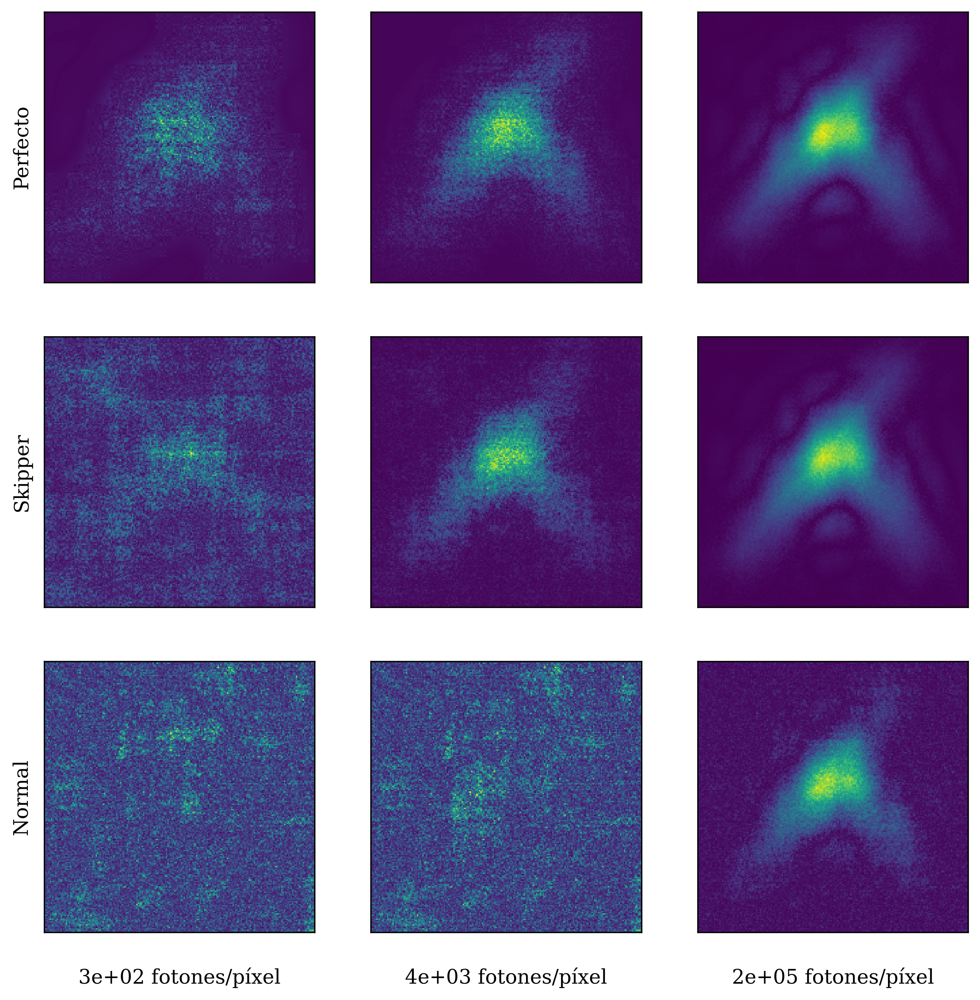

In [7]:
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

mse_list_per_sensor = {sensor_type: [] for sensor_type in sensor_types}
photons_per_pixel_list = np.geomspace(100, 500000, 10)
photons_per_pixel_list = photons_per_pixel_list[[1, 4, 8]]
for i, sensor_type in enumerate(sensor_types):
    for j, photons_per_pixel in enumerate(photons_per_pixel_list):

        with open(f'results/sensor_comparison_lambda_experiment/lambda | mura 5 | {sensor_type} | {photons_per_pixel}/simulator.pkl', 'rb') as file:
                simulator = pickle.load(file)

        optimal_threshold, mse = get_optimal_threshold(simulator)
        mse_list_per_sensor[sensor_type].append(mse)
        simulator.decoder.threshold = optimal_threshold
        simulator.decode_image()

        metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
        axs[i, j].imshow(simulator.decoder.rescaled_decoded_image)
        # axs[i, j].set_title(f"MSE: {metrics['mse']:.2g}")
        if j == 0:
            if sensor_type == 'normal_ccd':
                axs[i, j].set_ylabel(f'{sensor_type[:-4].capitalize()}')
            elif sensor_type == 'perfect':
                axs[i, j].set_ylabel('Perfecto')
            else:
                axs[i, j].set_ylabel(f'{sensor_type.capitalize()}')
        if i == 2:
            axs[i, j].set_xlabel(f'\n{photons_per_pixel:.0g} fotones/píxel')
        # Remove the ticks
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

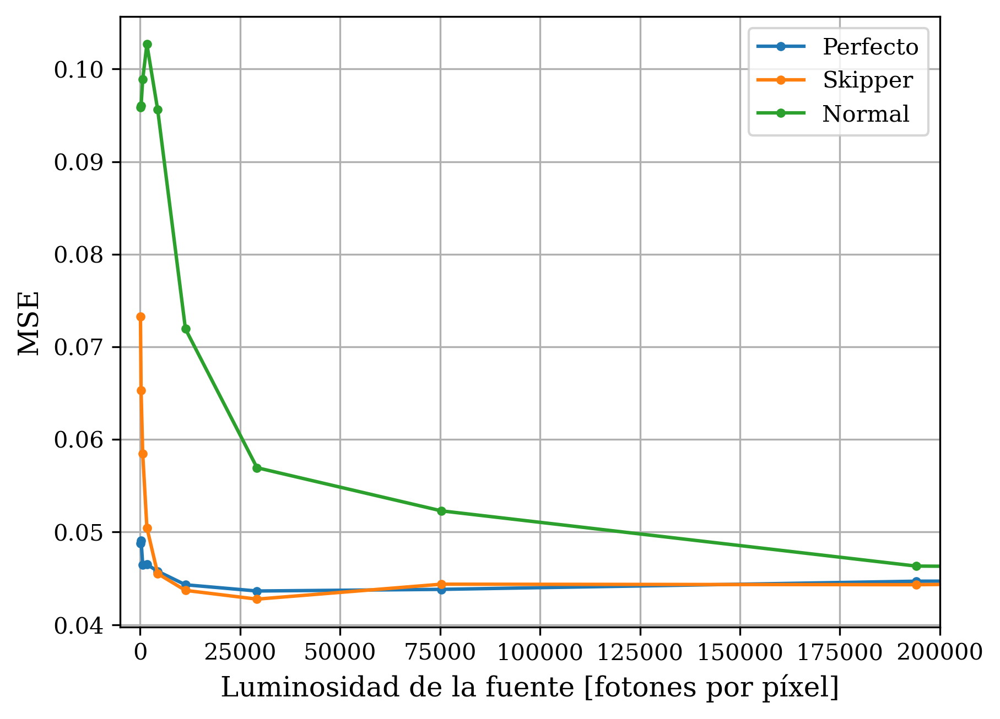

In [31]:
for sensor_type in sensor_types:
    if sensor_type == 'normal_ccd':
        plt.plot(photons_per_pixel_list, mse_list_per_sensor[sensor_type], '.-', label='Normal')
    elif sensor_type == 'perfect':
        plt.plot(photons_per_pixel_list, mse_list_per_sensor[sensor_type], '.-', label='Perfecto')
    else:
        plt.plot(photons_per_pixel_list, mse_list_per_sensor[sensor_type], '.-', label=sensor_type.capitalize())
plt.legend()
plt.ylabel('MSE')
plt.xlabel('Luminosidad de la fuente [fotones por píxel]')
plt.xlim(-5000, 200000)
plt.grid()

/Users/eitu/Documents/Facu/Labo6/CodedAperture/reconstruction_metrics.py:106: RuntimeWarning: divide by zero encountered in scalar divide
  hs_ratio = renormalized_decoded_image_hs / renormalized_source_hs


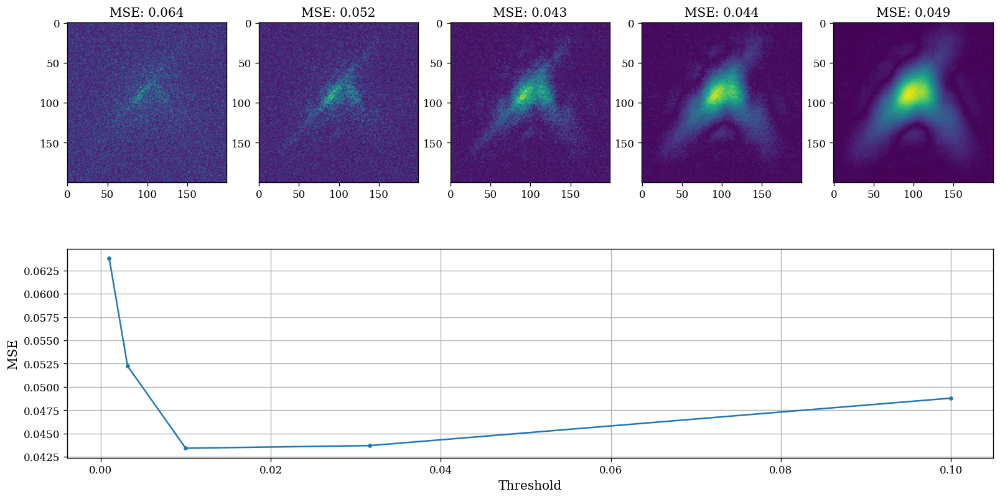

<Figure size 768x576 with 0 Axes>

In [96]:
import matplotlib.gridspec as gridspec

with open(f'results/sensor_comparison_lambda_experiment/lambda | mura 5 | normal_ccd | 500000.0/simulator.pkl', 'rb') as file:
        simulator = pickle.load(file)

# fig, axs = plt.subplots(1, 5, figsize=(16, 4))
fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(2, 5, figure=fig)

mse_per_threshold = []
threshold_list = np.geomspace(0.001, 0.1, 5)
for i, threshold in enumerate(threshold_list):
    ax = fig.add_subplot(gs[0, i])
    simulator.decoder.threshold = threshold
    simulator.decode_image()

    metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
    mse_per_threshold.append(metrics['mse'])
    ax.imshow(simulator.decoder.rescaled_decoded_image)
    ax.set_title(f"MSE: {metrics['mse']:.2g}")

ax_large = fig.add_subplot(gs[1, :])

ax_large.plot(threshold_list, mse_per_threshold, '.-')
ax_large.set_xlabel('Threshold')
ax_large.set_ylabel('MSE')
plt.grid()
plt.show()

plt.tight_layout()
plt.show()

### Lambda Reconstruction Method Comparison

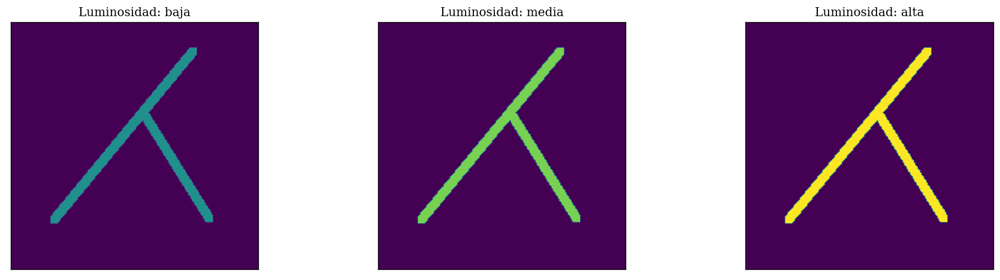

In [111]:
with open(f'results/reconstruction_method_experiment/lambda | mura 5 | perfect | fourier/simulator.pkl', 'rb') as file:
    simulator = pickle.load(file)

fig, axs = plt.subplots(1, 3, figsize=(16, 4))
cmap = 'viridis'  # Choose the desired colormap

luminosidad = ['baja', 'media', 'alta']

for i, brightness in enumerate([0.15, 0.24, 0.3]):
    source_screen = simulator.source.screen * brightness
    im = axs[i].imshow(source_screen, cmap=cmap, vmin=0, vmax=30000)
    axs[i].set_title(f"Luminosidad: {luminosidad[i]}")
    axs[i].set_xticks([])
    axs[i].set_yticks([])
plt.tight_layout()
plt.show()

/Users/eitu/Documents/Facu/Labo6/CodedAperture/reconstruction_metrics.py:106: RuntimeWarning: divide by zero encountered in scalar divide
  hs_ratio = renormalized_decoded_image_hs / renormalized_source_hs


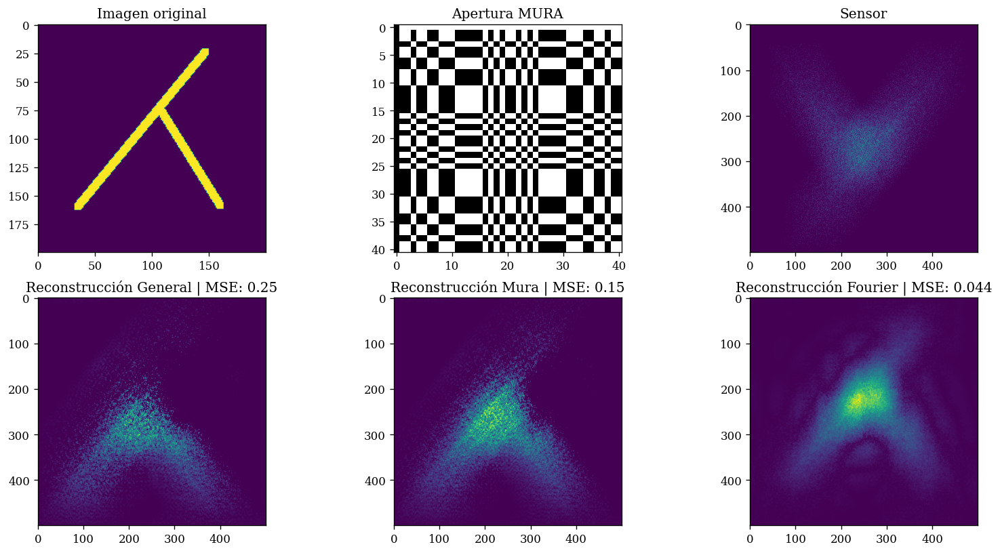

In [227]:
reconstruction_methods = ['general', 'mura', 'fourier']

mse_per_method = {method: 0 for method in reconstruction_methods}
fig, axs = plt.subplots(2, 3, figsize=(16, 8))



for i, reconstruction_method in enumerate(reconstruction_methods):
    with open(f'results/reconstruction_method_experiment/lambda | mura 5 | perfect | {reconstruction_method}/simulator.pkl', 'rb') as file:
        simulator = pickle.load(file)
    if reconstruction_method == 'fourier':

        # Plot the experiment screens
        axs[0, 0].imshow(simulator.source.screen, cmap='viridis')
        axs[0, 0].set_title('Imagen original')
        axs[0, 1].imshow(simulator.slit.mask, cmap='binary_r')
        axs[0, 1].set_title('Apertura MURA')
        axs[0, 2].imshow(simulator.sensor.screen, cmap='viridis')
        axs[0, 2].set_title('Sensor')

        # Get the optimal threshold for the decoding, and re-decode the image.
        optimal_threshold, _ = get_optimal_threshold(simulator)
        simulator.decoder.threshold = optimal_threshold
        simulator.decode_image()

    metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
    mse_per_method[reconstruction_method] = metrics['mse']

    vmin, vmax = 0, np.max(simulator.decoder.rescaled_decoded_image)
    axs[1, i].imshow(simulator.decoder.decoded_image, cmap='viridis', vmin=vmin, vmax=vmax)
    axs[1, i].set_title(f"Reconstrucción {reconstruction_method.capitalize()} | MSE: {metrics['mse']:.2g}")
plt.show()

## Tripple Pinhole Reconstruction Comparison

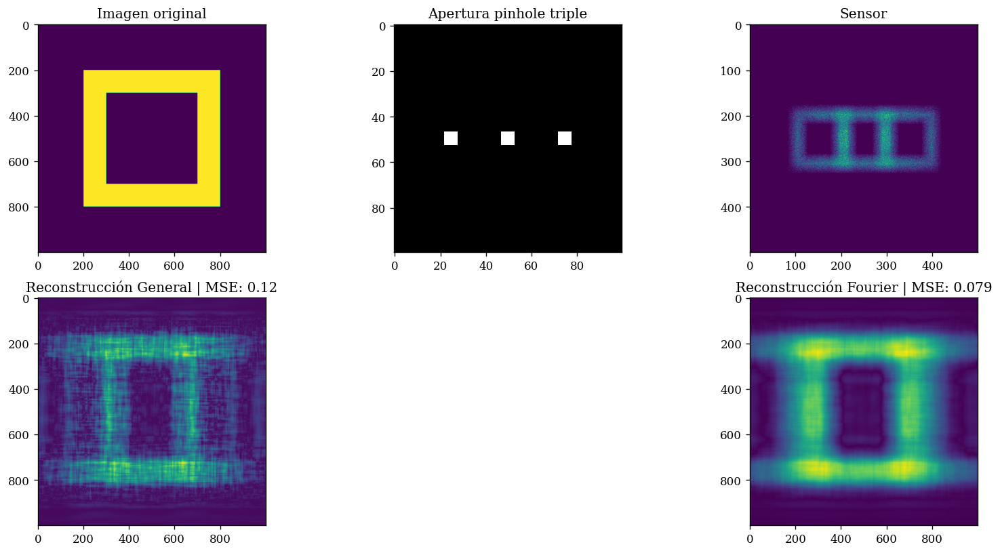

In [21]:
reconstruction_methods = ['general', 'mura', 'fourier']

with open(f'results/reconstruction_method_experiment/frame | tripple_pinhole | perfect 3 | fourier/simulator.pkl', 'rb') as file:
    simulator = pickle.load(file)

fig, axs = plt.subplots(2, 3, figsize=(16, 8))

# Plot the experiment screens
axs[0, 0].imshow(simulator.source.screen, cmap='viridis')
axs[0, 0].set_title('Imagen original')
axs[0, 1].imshow(simulator.slit.mask, cmap='binary_r')
axs[0, 1].set_title('Apertura pinhole triple')
axs[0, 2].imshow(simulator.sensor.screen, cmap='viridis')
axs[0, 2].set_title('Sensor')

for i, reconstruction_method in enumerate(reconstruction_methods):
    if reconstruction_method == 'fourier':
        optimal_threshold, _ = get_optimal_threshold(simulator, min_threshold=0.01, max_threshold=0.12)
        simulator.decoder.threshold = optimal_threshold
        simulator.decode_image()
    elif reconstruction_method == 'general':
        simulator.decoder.reconstruction_method = reconstruction_method
        simulator.decode_image()
    else:
        # Delete the axis
        axs[1, i].axis('off')
        continue
    metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
    axs[1, i].imshow(simulator.decoder.rescaled_decoded_image)
    axs[1, i].set_title(f"Reconstrucción {reconstruction_method.capitalize()} | MSE: {metrics['mse']:.2g}")
plt.show()

### Mura

/Users/eitu/Documents/Facu/Labo6/CodedAperture/reconstruction_metrics.py:106: RuntimeWarning: divide by zero encountered in scalar divide
  hs_ratio = renormalized_decoded_image_hs / renormalized_source_hs


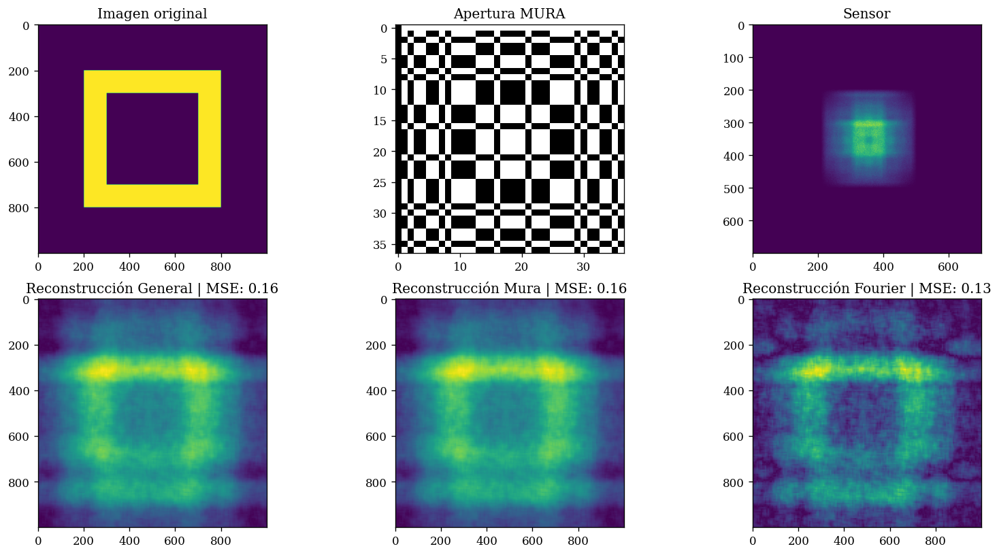

In [30]:
reconstruction_methods = ['general', 'mura', 'fourier']

with open(f'results/reconstruction_method_experiment/frame | mura | perfect | fourier/simulator.pkl', 'rb') as file:
    simulator = pickle.load(file)

fig, axs = plt.subplots(2, 3, figsize=(16, 8))

# Plot the experiment screens
axs[0, 0].imshow(simulator.source.screen, cmap='viridis')
axs[0, 0].set_title('Imagen original')
axs[0, 1].imshow(simulator.slit.mask, cmap='binary_r')
axs[0, 1].set_title('Apertura MURA')
axs[0, 2].imshow(simulator.sensor.screen, cmap='viridis')
axs[0, 2].set_title('Sensor')

for i, reconstruction_method in enumerate(reconstruction_methods):
    if reconstruction_method == 'fourier':
        optimal_threshold, _ = get_optimal_threshold(simulator, min_threshold=0.0005, max_threshold=0.003)
        simulator.decoder.threshold = optimal_threshold
        simulator.decode_image()
    else:
        simulator.decoder.reconstruction_method = reconstruction_method
        simulator.decode_image()
    metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
    axs[1, i].imshow(simulator.decoder.rescaled_decoded_image)
    axs[1, i].set_title(f"Reconstrucción {reconstruction_method.capitalize()} | MSE: {metrics['mse']:.2g}")
plt.show()

## Last Slide

0.07666126895133553


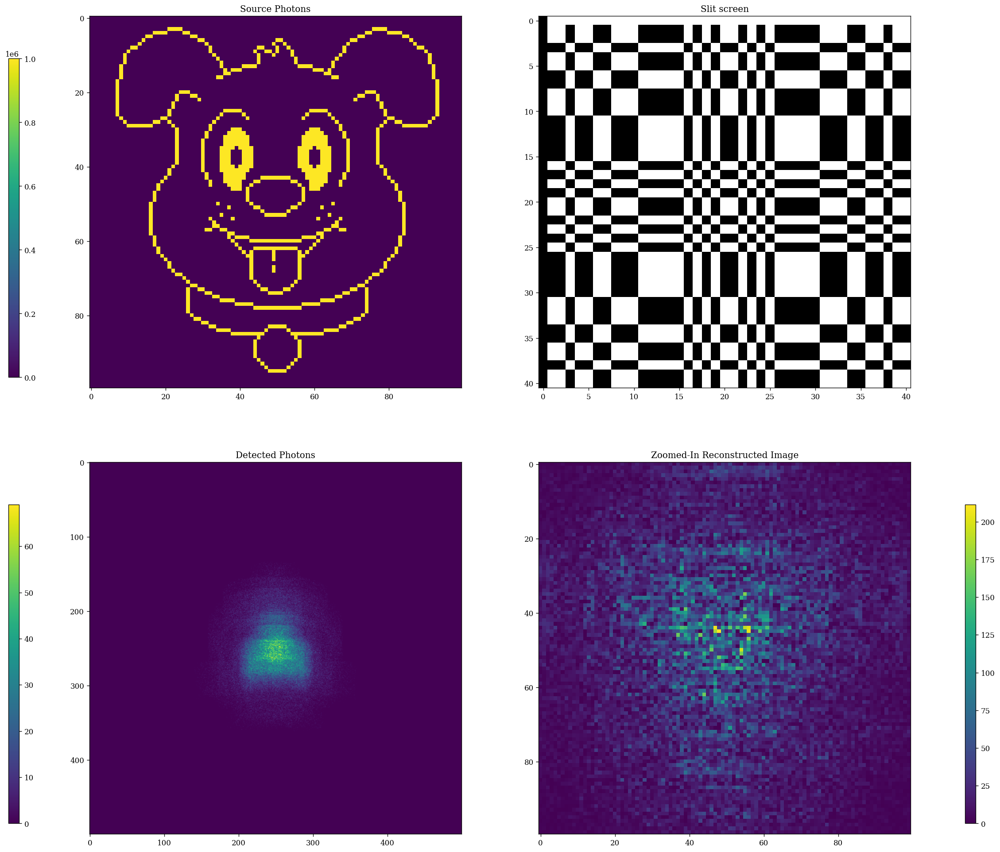

0.07459052490282204


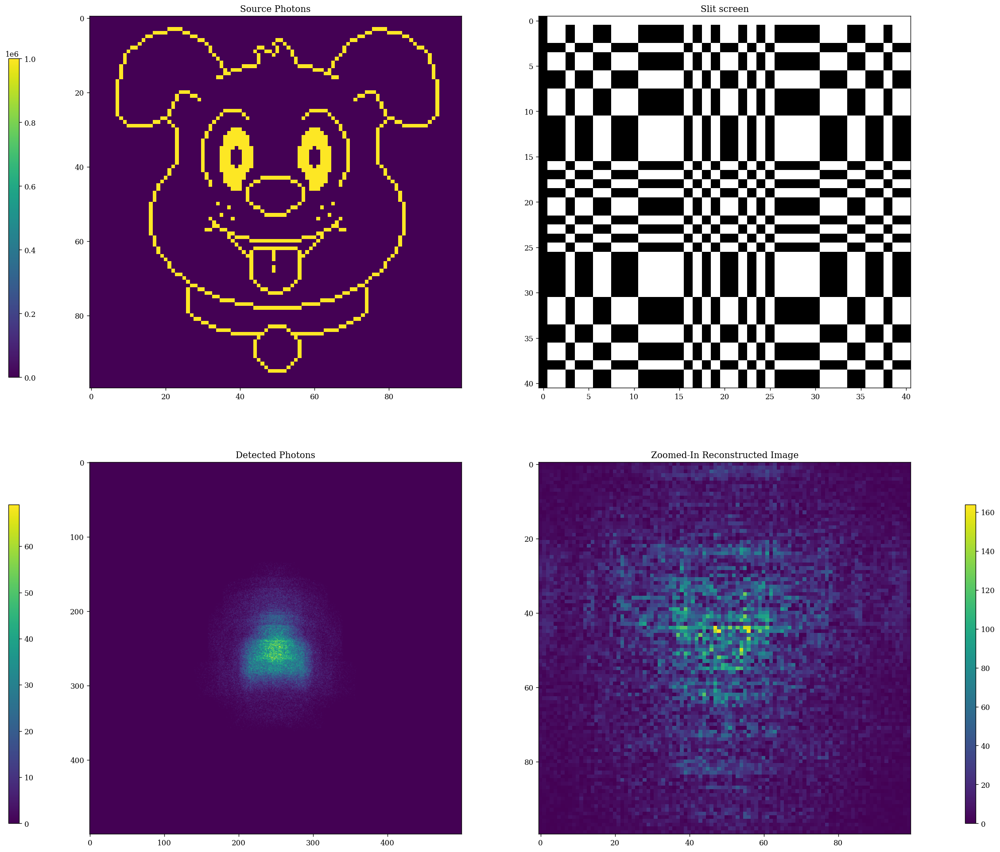

0.07297936176617305


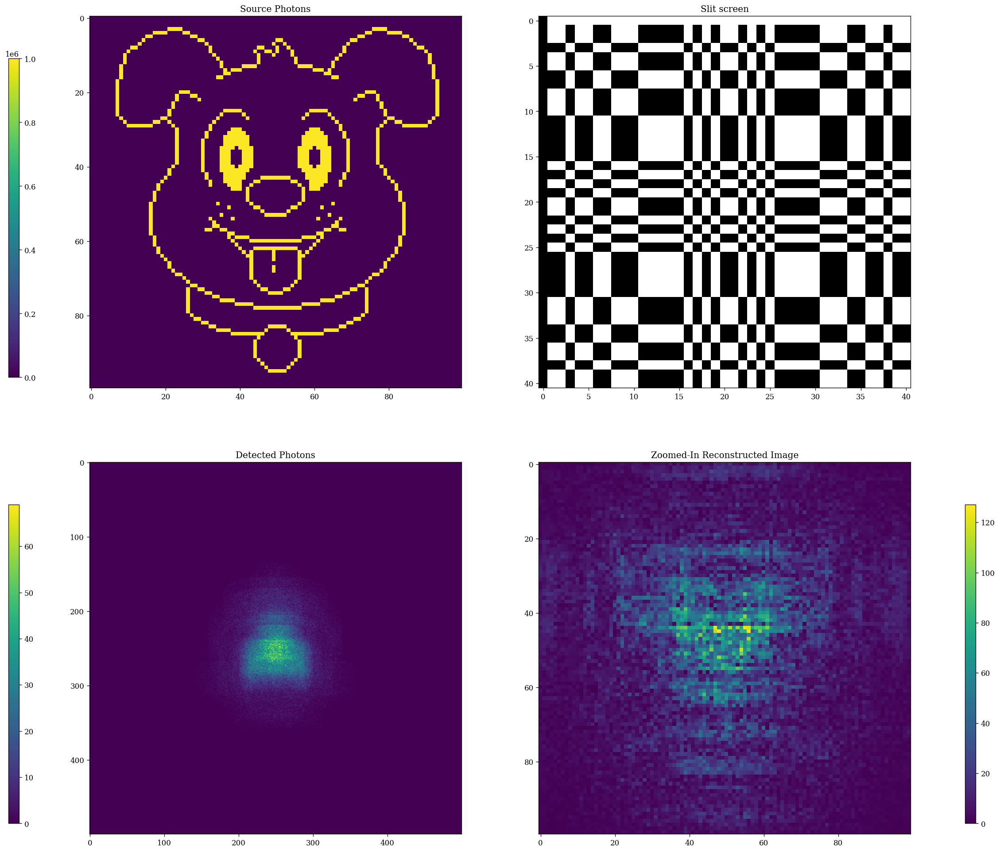

0.07403712515177163


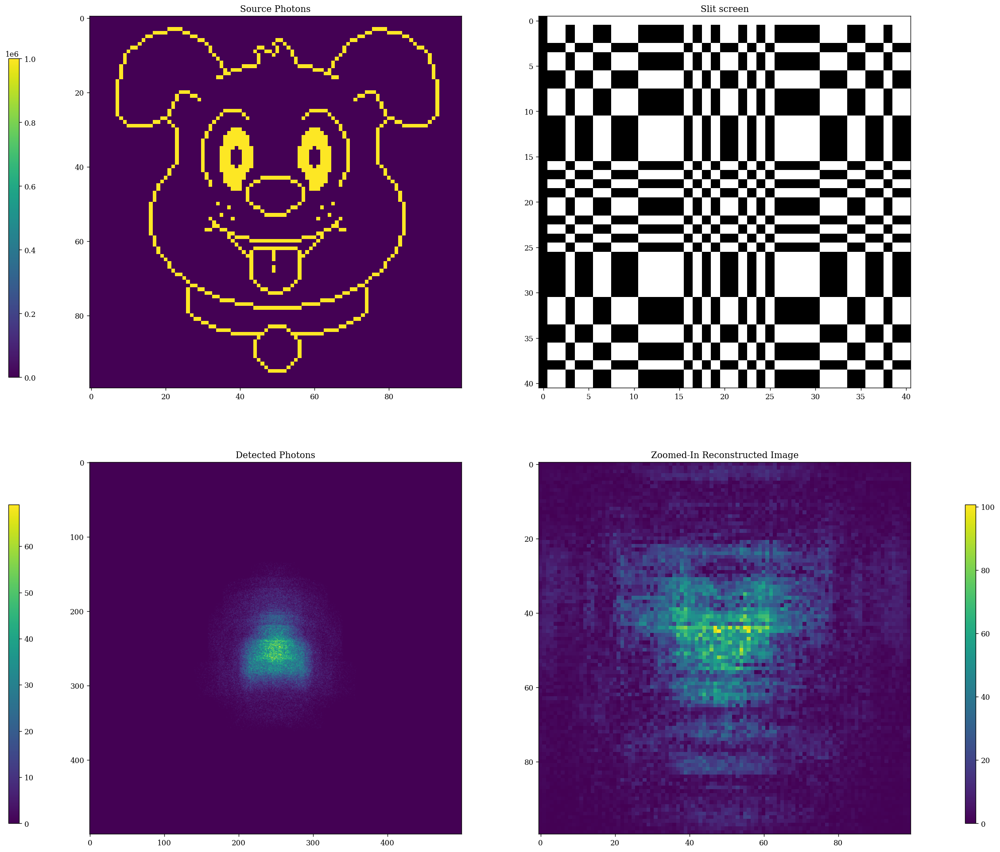

0.07576936780496935


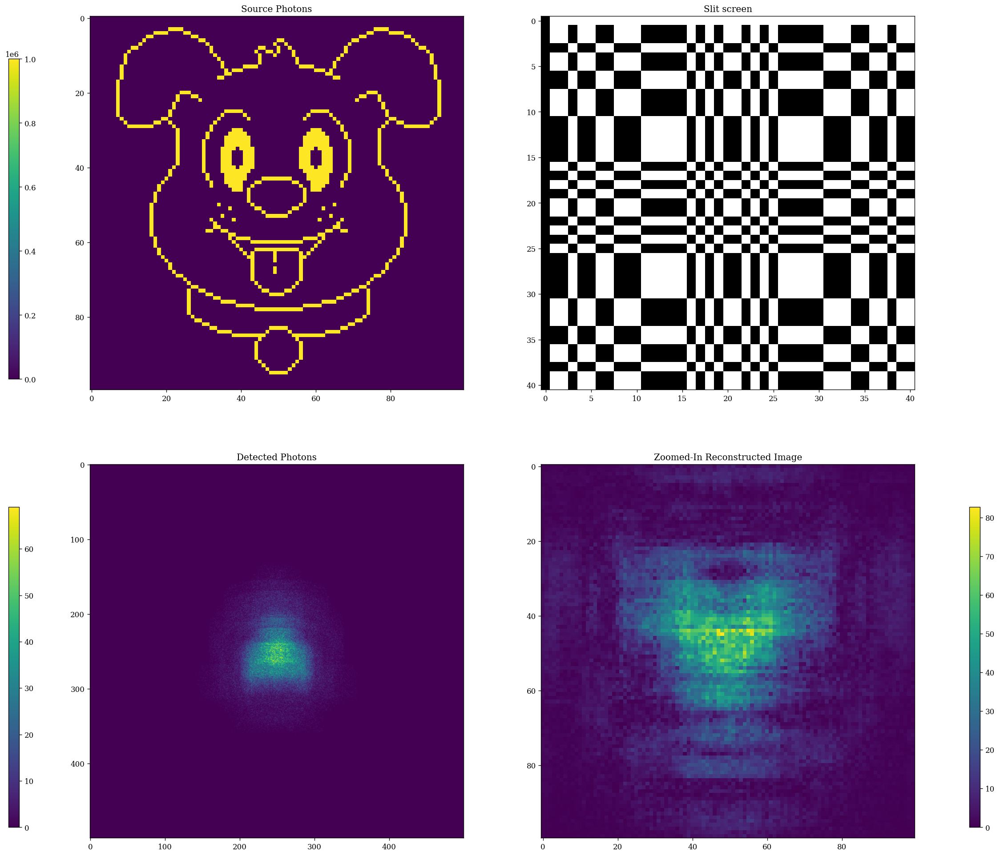

0.07987927088273364


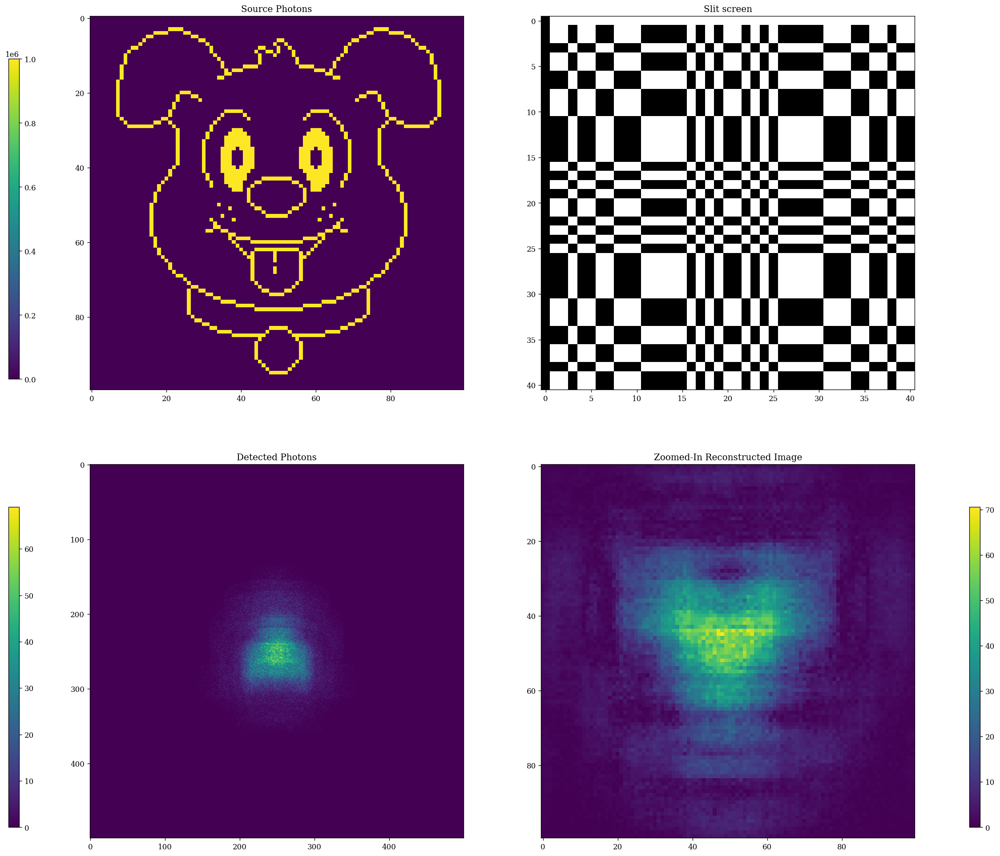

0.08424684140277189


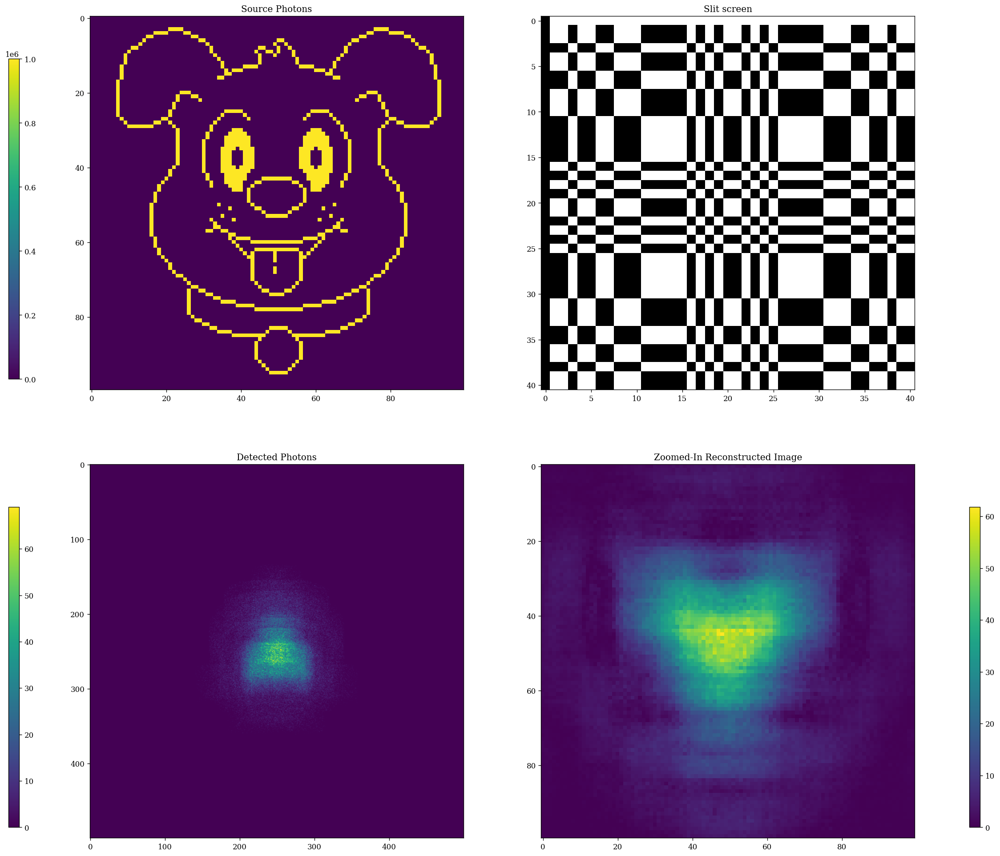

0.08850434337047736


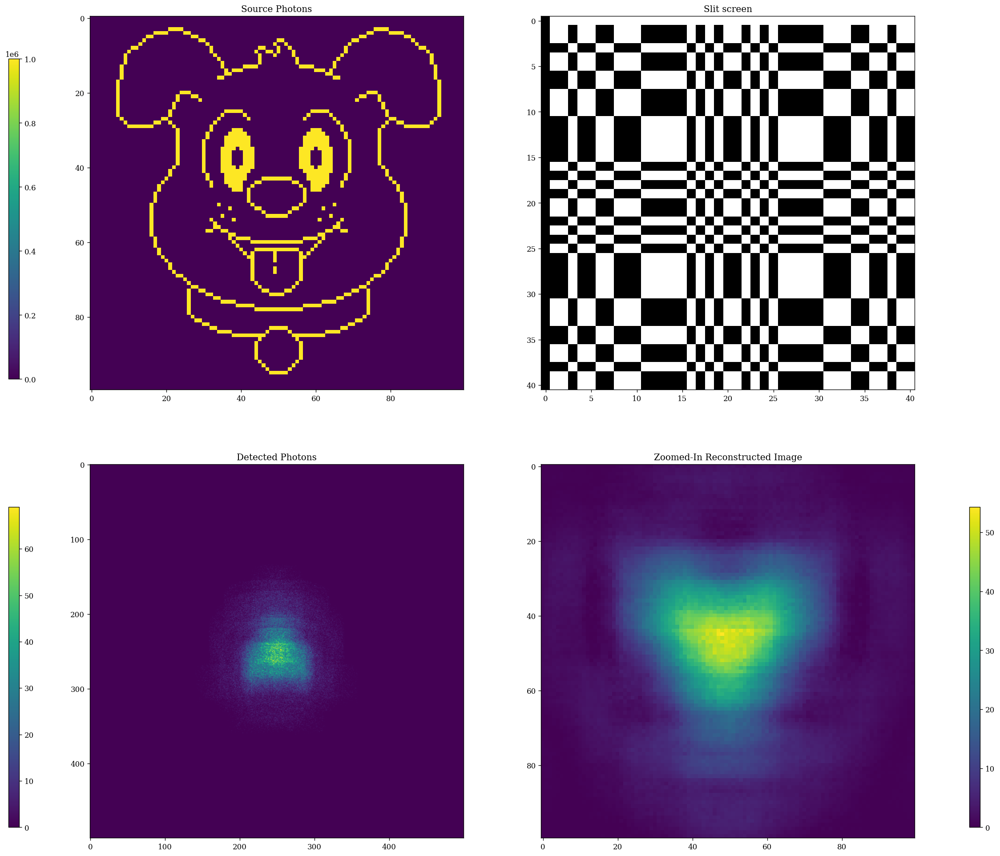

In [156]:
with open(f'results/config/dog | mura 5 | perfect/simulator.pkl', 'rb') as file:
    simulator = pickle.load(file)

thresholds = np.geomspace(0.001, 0.1, 8)

for threshold in thresholds:
    simulator.decoder.threshold = threshold
    simulator.decode_image()

    metrics = get_metrics(simulator.source, simulator.decoder, minmax_image_renormalization)
    print(metrics['mse'])

    # Plot the results
    fig = plt.figure(figsize=(20, 20))
    plt.subplot(2, 2, 1)
    vmin, vmax = 0, float(np.max(simulator.source.screen))
    plt.title("Source Photons")
    im = plt.imshow(simulator.source.screen, vmin=vmin, vmax=vmax, cmap="viridis")
    cbar_ax = fig.add_axes([0.05, 0.54, 0.01, 0.3])
    fig.colorbar(im, cax=cbar_ax)
    plt.subplot(2, 2, 2)
    plt.title("Slit screen")
    plt.imshow(simulator.slit.mask, cmap="binary_r")
    plt.subplot(2, 2, 3)
    vmin, vmax = 0, np.max(simulator.sensor.screen)
    plt.title("Detected Photons")
    im = plt.imshow(simulator.sensor.screen, vmin=vmin, vmax=vmax, cmap="viridis")
    cbar_ax = fig.add_axes([0.05, 0.12, 0.01, 0.3])
    fig.colorbar(im, cax=cbar_ax)
    plt.subplot(2, 2, 4)
    vmin, vmax = 0, np.max(simulator.decoder.rescaled_decoded_image)
    plt.title("Zoomed-In Reconstructed Image")
    im = plt.imshow(simulator.decoder.rescaled_decoded_image, vmin=vmin, vmax=vmax, cmap="viridis")
    cbar_ax = fig.add_axes([0.95, 0.12, 0.01, 0.3])
    fig.colorbar(im, cax=cbar_ax)
    plt.show()